In [1]:
#Dependencies
import requests
import pandas as pd
import json

import os
from dotenv import load_dotenv

import matplotlib.pyplot as plt
import numpy as np

geoapify_key= "54d1d648f1494709921cb4bbd4137b11"

In [2]:
#Read .csv file via pandas and show header, LACRIME_Test is one only portion of the whole database
LACrime_test="LAPD Crime_Data_from_2020_to_Present (2)-1.csv"
#Merging all of the databases into one. Database was too large it couldn't be read otherwise
LACrime_path= pd.concat(map(pd.read_csv, ["LAPD Crime_Data_from_2020_to_Present (2)-1.csv",
                                                                 "LAPD Crime_Data_from_2020_to_Present (2)-2.csv",
                                                                 "LAPD Crime_Data_from_2020_to_Present (2)-3.csv",
                                                                 "LAPD Crime_Data_from_2020_to_Present (2)-4.csv",
                                                                 "LAPD Crime_Data_from_2020_to_Present (2)-5.csv",
                                                                 "LAPD Crime_Data_from_2020_to_Present (2)-6.csv",
                                                                 "LAPD Crime_Data_from_2020_to_Present (2)-7.csv",
                                                                 "LAPD Crime_Data_from_2020_to_Present (2)-8.csv",
                                                                 "LAPD Crime_Data_from_2020_to_Present (2)-9.csv",
                                                                 "LAPD Crime_Data_from_2020_to_Present (2)-10.csv"
                                          ]))
LACrime_path.info()

<class 'pandas.core.frame.DataFrame'>
Index: 811663 entries, 0 to 81159
Data columns (total 28 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   DR_NO           811663 non-null  int64  
 1   Date Rptd       811663 non-null  object 
 2   DATE OCC        811663 non-null  object 
 3   TIME OCC        811663 non-null  int64  
 4   AREA            811663 non-null  int64  
 5   AREA NAME       811663 non-null  object 
 6   Rpt Dist No     811663 non-null  int64  
 7   Part 1-2        811663 non-null  int64  
 8   Crm Cd          811663 non-null  int64  
 9   Crm Cd Desc     811663 non-null  object 
 10  Mocodes         699639 non-null  object 
 11  Vict Age        811663 non-null  int64  
 12  Vict Sex        705139 non-null  object 
 13  Vict Descent    705131 non-null  object 
 14  Premis Cd       811654 non-null  float64
 15  Premis Desc     811184 non-null  object 
 16  Weapon Used Cd  282783 non-null  float64
 17  Weapon Desc     

In [3]:
LACrime = LACrime_path[["LAT", "LON", "DATE OCC","TIME OCC","Crm Cd","AREA", "AREA NAME","Status","Vict Sex","Vict Age","Vict Descent","Weapon Used Cd","Weapon Desc","Crm Cd Desc"]].copy()
LACrime

,LAT,LON,DATE OCC,TIME OCC,Crm Cd,AREA,AREA NAME,Status,Vict Sex,Vict Age,Vict Descent,Weapon Used Cd,Weapon Desc,Crm Cd Desc
0,34.0141,-118.2978,1/8/20 0:00,2230,624,3,Southwest,AO,F,36,B,400.0,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",BATTERY - SIMPLE ASSAULT
1,34.0459,-118.2545,1/1/20 0:00,330,624,1,Central,IC,M,25,H,500.0,UNKNOWN WEAPON/OTHER WEAPON,BATTERY - SIMPLE ASSAULT
2,34.0448,-118.2474,2/13/20 0:00,1200,845,1,Central,AA,X,0,X,NaN,NaN,SEX OFFENDER REGISTRANT OUT OF COMPLIANCE
3,34.1685,-118.4019,1/1/20 0:00,1730,745,15,N Hollywood,IC,F,76,W,NaN,NaN,VANDALISM - MISDEAMEANOR ($399 OR UNDER)
4,34.2198,-118.4468,1/1/20 0:00,415,740,19,Mission,IC,X,31,X,NaN,NaN,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
81155,34.2466,-118.4054,1/26/23 0:00,1800,740,16,Foothill,IC,M,23,H,NaN,NaN,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA..."
81156,34.2790,-118.4116,3/22/23 0:00,1000,230,16,Foothill,IC,F,25,H,400.0,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)","ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT"
81157,33.9841,-118.2915,4/12/23 0:00,1630,230,12,77th Street,IC,M,29,B,500.0,UNKNOWN WEAPON/OTHER WEAPON,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT"
81158,34.0467,-118.2485,7/1/23 0:00,1,352,1,Central,IC,F,24,H,NaN,NaN,PICKPOCKET


In [4]:
#Find the variables in columns
gender_variables = LACrime["Vict Sex"].unique()

print(f"The unique variables in column are: {gender_variables}")

The unique variables in column are: ['F' 'M' 'X' nan 'H' '-']


In [5]:
#Count how many females, males and unknowns there are in the DataFrame

#Fill in the Na/NaN values with zero in order to remove the rows from the DataFrame
LACrime["Vict Sex"].fillna(0,inplace=True)

#Filters out the unnecessary variables like "nan", "H" & "-" in the "Vict Sex" column
def filter_rows_by_variable(df, col, values):
    return df[~df[col].isin(values)]

LACrime_gender=filter_rows_by_variable(LACrime,"Vict Sex",[0,"H","-"])

LACrime_gender

,LAT,LON,DATE OCC,TIME OCC,Crm Cd,AREA,AREA NAME,Status,Vict Sex,Vict Age,Vict Descent,Weapon Used Cd,Weapon Desc,Crm Cd Desc
0,34.0141,-118.2978,1/8/20 0:00,2230,624,3,Southwest,AO,F,36,B,400.0,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",BATTERY - SIMPLE ASSAULT
1,34.0459,-118.2545,1/1/20 0:00,330,624,1,Central,IC,M,25,H,500.0,UNKNOWN WEAPON/OTHER WEAPON,BATTERY - SIMPLE ASSAULT
2,34.0448,-118.2474,2/13/20 0:00,1200,845,1,Central,AA,X,0,X,NaN,NaN,SEX OFFENDER REGISTRANT OUT OF COMPLIANCE
3,34.1685,-118.4019,1/1/20 0:00,1730,745,15,N Hollywood,IC,F,76,W,NaN,NaN,VANDALISM - MISDEAMEANOR ($399 OR UNDER)
4,34.2198,-118.4468,1/1/20 0:00,415,740,19,Mission,IC,X,31,X,NaN,NaN,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
81155,34.2466,-118.4054,1/26/23 0:00,1800,740,16,Foothill,IC,M,23,H,NaN,NaN,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA..."
81156,34.2790,-118.4116,3/22/23 0:00,1000,230,16,Foothill,IC,F,25,H,400.0,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)","ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT"
81157,33.9841,-118.2915,4/12/23 0:00,1630,230,12,77th Street,IC,M,29,B,500.0,UNKNOWN WEAPON/OTHER WEAPON,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT"
81158,34.0467,-118.2485,7/1/23 0:00,1,352,1,Central,IC,F,24,H,NaN,NaN,PICKPOCKET


In [6]:
print("LACrime_gender[Vict Sex].unique() "+str(LACrime_gender["Vict Sex"].unique()))
print("----------------------------------------------------------------------------")
print("LACrime_gender[Vict Age].unique() "+str(LACrime_gender["Vict Age"].unique()))
print("----------------------------------------------------------------------------")
print("LACrime_gender[AREA NAME].unique() "+str(LACrime_gender["AREA NAME"].unique()))
print("----------------------------------------------------------------------------")


LACrime_gender[Vict Sex].unique() ['F' 'M' 'X']
----------------------------------------------------------------------------
LACrime_gender[Vict Age].unique() [36 25  0 76 31 23 29 35 41 24 34 46 66 40 27 62 43 71 50 19 51 33 69 39
 57 78 52 38 55 44 18 54 22 28 42 56 67 37 60 61 59 32 30 45 20 15 58 47
 48 26 21 64 75 12 49 68 14 13 10 53 74 65 63  8 16 72 70  9 90 85 81 79
 94 73 11 17 80  5 82  2 77 84 88 96 99  7 86 92  3 83 87  6 -1 89  4 93
 98 91 95 97 -2 -3]
----------------------------------------------------------------------------
LACrime_gender[AREA NAME].unique() ['Southwest' 'Central' 'N Hollywood' 'Mission' 'Devonshire' 'Northeast'
 'Harbor' 'Van Nuys' 'West Valley' 'West LA' 'Wilshire' 'Rampart'
 '77th Street' 'Hollenbeck' 'Southeast' 'Pacific' 'Newton' 'Hollywood'
 'Foothill' 'Olympic' 'Topanga']
----------------------------------------------------------------------------


In [7]:
#Create a list for the unique variables in the column "Vict Sex"
gender=[]
gender.append(LACrime_gender["Vict Sex"].unique())
print(gender)

[array(['F', 'M', 'X'], dtype=object)]


In [8]:
female_num=(LACrime_gender["Vict Sex"].value_counts()["F"])
print(f"number of female cases: {female_num}")

male_num=(LACrime_gender["Vict Sex"].value_counts()["M"])
print(f"number of male cases: {male_num}")

unknown_num=(LACrime_gender["Vict Sex"].value_counts()["X"])
print(f"number of cases with unknown genders: {unknown_num}")

num_cases=(female_num+male_num+unknown_num)
print(f"total number of cases: {num_cases}")


number of female cases: 299086
number of male cases: 335428
number of cases with unknown genders: 70535
total number of cases: 705049


In [9]:
#Creating a for loop for the function in the list
for i in gender:
    cases_gender = LACrime_gender["Vict Sex"].value_counts()[i]
    print(f"Number of Cases for {(i)} Category: {cases_gender}")
    print(f'Total Number of Cases: {cases_gender.sum()}')

Number of Cases for ['F' 'M' 'X'] Category: Vict Sex
F    299086
M    335428
X     70535
Name: count, dtype: int64
Total Number of Cases: 705049


In [10]:
#Create a Dataframe to graph a pie plot
total_genders=pd.DataFrame({
    "Female":[female_num],
    "Male":[male_num],
    "Unknown": [unknown_num]
})

total_genders

,Female,Male,Unknown
0,299086,335428,70535


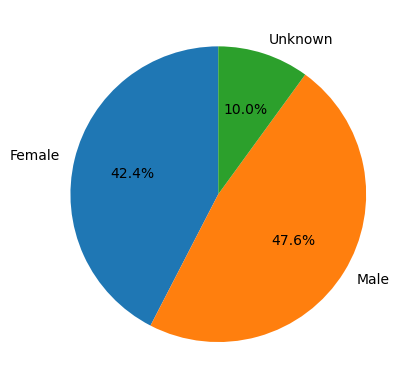

In [11]:
#plot the pie graph
#figureObject, axesObject = plt.subplots()
plt.pie([female_num,male_num,unknown_num],
        labels=["Female","Male","Unknown"],
        autopct="%1.1f%%",
        startangle=90)
plt.savefig("../LACrime_Gender_Distribution.png")
plt.show()

In [12]:
#Create a list for unique variables in the colymn "Vict Age"
age=[]
age.append(LACrime_gender["Vict Age"].unique())

print((age))
print("--------------------------------------------")

#Offers a list of attributes for the object
print(dir(age))
print("--------------------------------------------")

[array([36, 25,  0, 76, 31, 23, 29, 35, 41, 24, 34, 46, 66, 40, 27, 62, 43,
       71, 50, 19, 51, 33, 69, 39, 57, 78, 52, 38, 55, 44, 18, 54, 22, 28,
       42, 56, 67, 37, 60, 61, 59, 32, 30, 45, 20, 15, 58, 47, 48, 26, 21,
       64, 75, 12, 49, 68, 14, 13, 10, 53, 74, 65, 63,  8, 16, 72, 70,  9,
       90, 85, 81, 79, 94, 73, 11, 17, 80,  5, 82,  2, 77, 84, 88, 96, 99,
        7, 86, 92,  3, 83, 87,  6, -1, 89,  4, 93, 98, 91, 95, 97, -2, -3],
      dtype=int64)]
--------------------------------------------
['__add__', '__class__', '__class_getitem__', '__contains__', '__delattr__', '__delitem__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__getitem__', '__getstate__', '__gt__', '__hash__', '__iadd__', '__imul__', '__init__', '__init_subclass__', '__iter__', '__le__', '__len__', '__lt__', '__mul__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__reversed__', '__rmul__', '__setattr__', '__setitem__', '__sizeof__', '__str__', '__s

Status
AREA NAME   Vict Sex        
77th Street F          22727
            M          16872
            X           4188
Central     F          17635
            M          27649
...                      ...
West Valley M          17453
            X            109
Wilshire    F          13501
            M          16486
            X           4473

[63 rows x 1 columns]

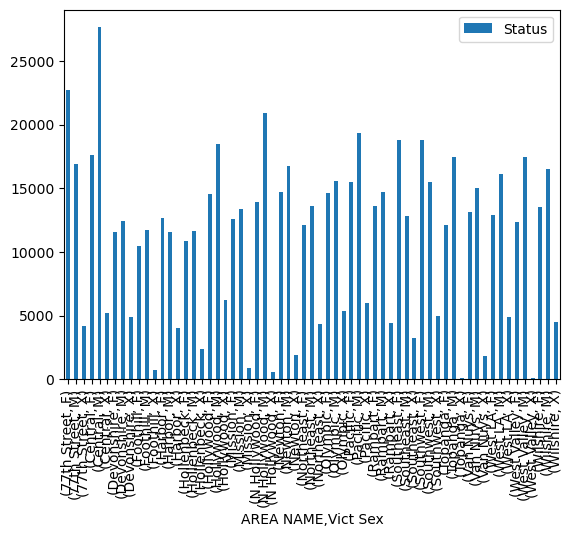

In [13]:
#plotting the bar graph based on this combined dataset results in one series that is hard to identifiy gender and locations
#Bar graph will not be used in presentation

LACrime_gender_area = LACrime_gender.groupby(["AREA NAME","Vict Sex"]).count()

del LACrime_gender_area["LAT"]
del LACrime_gender_area["LON"]
del LACrime_gender_area["DATE OCC"]
del LACrime_gender_area["TIME OCC"]
del LACrime_gender_area["Crm Cd"]
del LACrime_gender_area["Crm Cd Desc"]
del LACrime_gender_area["AREA"]
del LACrime_gender_area["Vict Age"]
del LACrime_gender_area["Vict Descent"]
del LACrime_gender_area["Weapon Used Cd"]
del LACrime_gender_area["Weapon Desc"]

LACrime_gender_area.plot.bar()
plt.savefig("../LACrime_Gender_vs_AreaName_Not_Clean.png")
LACrime_gender_area

In [14]:
#Create Dataframe based for each gender so that each can be an individual series in bar plot
female_df = LACrime_gender[(LACrime_gender["Vict Sex"]=="F")]
del female_df["LAT"]
del female_df["LON"]
del female_df["DATE OCC"]
del female_df["TIME OCC"]
del female_df["Crm Cd"]
del female_df["AREA"]
del female_df["Vict Age"]
del female_df["Vict Descent"]
del female_df["Weapon Used Cd"]
del female_df["Weapon Desc"]

female_df.head()

,AREA NAME,Status,Vict Sex,Crm Cd Desc
0,Southwest,AO,F,BATTERY - SIMPLE ASSAULT
3,N Hollywood,IC,F,VANDALISM - MISDEAMEANOR ($399 OR UNDER)
5,Central,IC,F,"RAPE, FORCIBLE"
14,Central,IC,F,SHOPLIFTING - PETTY THEFT ($950 & UNDER)
15,Mission,IC,F,INTIMATE PARTNER - SIMPLE ASSAULT


In [15]:

male_df = LACrime_gender[(LACrime_gender["Vict Sex"]=="M")]
del male_df["LAT"]
del male_df["LON"]
del male_df["DATE OCC"]
del male_df["TIME OCC"]
del male_df["Crm Cd"]
del male_df["AREA"]
del male_df["Vict Age"]
del male_df["Vict Descent"]
del male_df["Weapon Used Cd"]
del male_df["Weapon Desc"]

male_df.head()

,AREA NAME,Status,Vict Sex,Crm Cd Desc
1,Central,IC,M,BATTERY - SIMPLE ASSAULT
6,Central,IC,M,SHOPLIFTING - PETTY THEFT ($950 & UNDER)
8,Central,IC,M,"THEFT-GRAND ($950.01 & OVER)EXCPT,GUNS,FOWL,LI..."
10,Central,IC,M,BURGLARY FROM VEHICLE
11,Central,IC,M,CRIMINAL THREATS - NO WEAPON DISPLAYED


In [16]:

unknown_df = LACrime_gender[(LACrime_gender["Vict Sex"]=="X")]
del unknown_df["LAT"]
del unknown_df["LON"]
del unknown_df["DATE OCC"]
del unknown_df["TIME OCC"]
del unknown_df["Crm Cd"]
del unknown_df["AREA"]
del unknown_df["Vict Age"]
del unknown_df["Vict Descent"]
del unknown_df["Weapon Used Cd"]
del unknown_df["Weapon Desc"]

unknown_df.head()


,AREA NAME,Status,Vict Sex,Crm Cd Desc
2,Central,AA,X,SEX OFFENDER REGISTRANT OUT OF COMPLIANCE
4,Mission,IC,X,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA..."
7,Central,IC,X,OTHER MISCELLANEOUS CRIME
9,Devonshire,AO,X,"THEFT-GRAND ($950.01 & OVER)EXCPT,GUNS,FOWL,LI..."
13,Central,IC,X,ARSON


In [17]:
#Shows the total number of cases based on Area Name for female
female_area = female_df.groupby(["AREA NAME","Vict Sex"]).count()
del female_area["Crm Cd Desc"]

female_area.pivot_table(index="Vict Sex",columns="AREA NAME")

Status                                                   \
AREA NAME 77th Street  Central Devonshire Foothill   Harbor Hollenbeck   
Vict Sex                                                                 
F             22727.0  17635.0    11587.0  10436.0  12634.0    10854.0   

                                                   ...                    \
AREA NAME Hollywood  Mission N Hollywood   Newton  ...  Olympic  Pacific   
Vict Sex                                           ...                     
F           14586.0  12622.0     13948.0  14701.0  ...  14599.0  15454.0   

                                                                               \
AREA NAME  Rampart Southeast Southwest  Topanga Van Nuys  West LA West Valley   
Vict Sex                                                                        
F          13582.0   18772.0   18762.0  12116.0  13140.0  12927.0     12356.0   

                    
AREA NAME Wilshire  
Vict Sex            
F          13501.0  

[1 rows x 21 columns]

In [18]:
#Shows the total number of cases based on Area Name for female
male_area = male_df.groupby(["AREA NAME","Vict Sex"]).count()
del male_area["Crm Cd Desc"]

male_area.pivot_table(index="Vict Sex",columns="AREA NAME")

Status                                                   \
AREA NAME 77th Street  Central Devonshire Foothill   Harbor Hollenbeck   
Vict Sex                                                                 
M             16872.0  27649.0    12443.0  11720.0  11592.0    11658.0   

                                                   ...                    \
AREA NAME Hollywood  Mission N Hollywood   Newton  ...  Olympic  Pacific   
Vict Sex                                           ...                     
M           18444.0  13384.0     20906.0  16748.0  ...  15573.0  19308.0   

                                                                               \
AREA NAME  Rampart Southeast Southwest  Topanga Van Nuys  West LA West Valley   
Vict Sex                                                                        
M          14743.0   12790.0   15525.0  17421.0  15051.0  16090.0     17453.0   

                    
AREA NAME Wilshire  
Vict Sex            
M          16486.0  

[1 rows x 21 columns]

In [19]:
#Shows the total number of cases based on Area Name for unknown sex
unknown_area = unknown_df.groupby(["AREA NAME","Vict Sex"]).count()
unknown_area.pivot_table(index="Vict Sex",columns="AREA NAME")

Crm Cd Desc                                                 \
AREA NAME 77th Street Central Devonshire Foothill  Harbor Hollenbeck   
Vict Sex                                                               
X              4188.0  5185.0     4864.0    732.0  3987.0     2376.0   

                                                 ...  Status                  \
AREA NAME Hollywood Mission N Hollywood  Newton  ... Olympic Pacific Rampart   
Vict Sex                                         ...                           
X            6231.0   903.0       547.0  1916.0  ...  5321.0  5993.0  4399.0   

                                                                             
AREA NAME Southeast Southwest Topanga Van Nuys West LA West Valley Wilshire  
Vict Sex                                                                     
X            3275.0    4927.0    96.0   1829.0  4867.0       109.0   4473.0  

[1 rows x 42 columns]

In [20]:
#Combine the transposed data in order to plot genders vs area name
gender_area_combined = pd.merge(pd.merge(male_area, unknown_area, on="AREA NAME"),female_area,on="AREA NAME")

#Reorderd the transposed Dataframe
gender_area_reorder = gender_area_combined[["Status","Status_x","Status_y"]]

#Rename the transposed Dataframe columns
gender_area_reorder.rename(columns={"Status_x":"Male",
                           "Status_y":"Unknown",
                           "Status":"Female"
                            })

,Female,Male,Unknown
AREA NAME,,,
77th Street,22727,16872,4188
Central,17635,27649,5185
Devonshire,11587,12443,4864
Foothill,10436,11720,732
Harbor,12634,11592,3987
Hollenbeck,10854,11658,2376
Hollywood,14586,18444,6231
Mission,12622,13384,903
N Hollywood,13948,20906,547


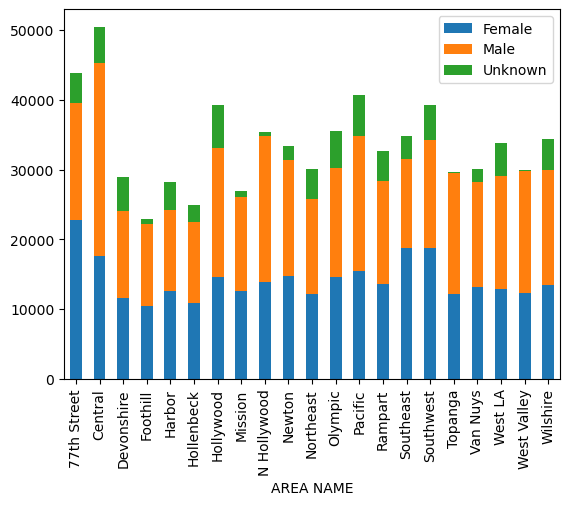

In [21]:
gender_area_reorder.plot.bar(stacked=True)
plt.legend(["Female","Male","Unknown"])
plt.savefig("../LACrime_Gender_vs_AreaName.png")

In [22]:

LACrime_gender["Crm Cd Desc"] = LACrime_gender["Crm Cd Desc"].replace(['LETTERS, LEWD  -  TELEPHONE CALLS, LEWD' ,
                                                        'VIOLATION OF COURT ORDER', 'DISTURBING THE PEACE',
                                                        'TRESPASSING' , 
                                                        'VIOLATION OF RESTRAINING ORDER', 
                                                        'BOMB SCARE', 
                                                        'OTHER MISCELLANEOUS CRIME',
                                                        'VIOLATION OF TEMPORARY RESTRAINING ORDER' ,
                                                        'FAILURE TO YIELD' ,
                                                        'THREATENING PHONE CALLS/LETTERS' ,
                                                        'RESISTING ARREST',
                                                        'INCITING A RIOT', 
                                                        'BLOCKING DOOR INDUCTION CENTER' , 
                                                        'FAILURE TO DISPERSE', 
                                                        'STALKING',
                                                        'PROWLER',
                                                        'DISRUPT SCHOOL', 
                                                        'FALSE POLICE REPORT', 
                                                        'FIREARMS RESTRAINING ORDER (FIREARMS RO)', 
                                                        'ILLEGAL DUMPING' , 
                                                        'RECKLESS DRIVING',
                                                        'CONSPIRACY', 
                                                        'PANDERING', 
                                                        'FIREARMS EMERGENCY PROTECTIVE ORDER (FIREARMS EPO)', 
                                                        'REPLICA FIREARMS(SALE,DISPLAY,MANUFACTURE OR DISTRIBUTE)',
                                                       'CRIMINAL THREATS - NO WEAPON DISPLAYED',
                                                       'DRUNK ROLL',
                                                        'DRIVING WITHOUT OWNER CONSENT (DWOC)'],
                                                       "DISTURBING THE PEACE & HARASSMENT"

                                                      )

LACrime_gender["Crm Cd Desc"] = LACrime_gender["Crm Cd Desc"].replace(['KIDNAPPING', 
                                                        'KIDNAPPING - GRAND ATTEMPT' , 
                                                        'FALSE IMPRISONMENT'],
                                                       'KIDNAPPING'
                                                      )

LACrime_gender["Crm Cd Desc"] = LACrime_gender["Crm Cd Desc"].replace(['EXTORTION' ,
                                                        'DOCUMENT FORGERY / STOLEN FELONY' , 
                                                        'UNAUTHORIZED COMPUTER ACCESS',
                                                        'DOCUMENT WORTHLESS ($200 & UNDER)' , 
                                                        'DOCUMENT WORTHLESS ($200.01 & OVER)',
                                                        'COUNTERFEIT', 
                                                        'BRIBERY',
                                                        'CONTRIBUTING'], 
                                                       'FRAUD & FORGERY'
                                                      )

LACrime_gender["Crm Cd Desc"] = LACrime_gender["Crm Cd Desc"].replace(['BURGLARY',
                                                        'BURGLARY FROM VEHICLE', 
                                                        'BIKE - STOLEN' ,
                                                        'THEFT, PERSON',
                                                        'PURSE SNATCHING',
                                                        'BURGLARY, ATTEMPTED', 
                                                        'PICKPOCKET, ATTEMPT', 
                                                        'THEFT-GRAND ($950.01 & OVER)EXCPT,GUNS,FOWL,LIVESTK,PROD',
                                                        'SHOPLIFTING - PETTY THEFT ($950 & UNDER)', 
                                                        'THEFT PLAIN - PETTY ($950 & UNDER)',
                                                        'THEFT FROM MOTOR VEHICLE - PETTY ($950 & UNDER)',
                                                        'DISHONEST EMPLOYEE - PETTY THEFT' , 
                                                        'THEFT, COIN MACHINE - PETTY ($950 & UNDER)',
                                                        'THEFT, COIN MACHINE - ATTEMPT', 'BIKE - ATTEMPTED STOLEN' ,
                                                        'PURSE SNATCHING - ATTEMPT' ,
                                                        'BUNCO, PETTY THEFT',
                                                        'PETTY THEFT - AUTO REPAIR', 
                                                        'TILL TAP - PETTY ($950 & UNDER)',
                                                        'VEHICLE - STOLEN' ,
                                                        'BUNCO, ATTEMPT',
                                                        'CREDIT CARDS, FRAUD USE ($950 & UNDER',
                                                        'BURGLARY FROM VEHICLE, ATTEMPTED' ,
                                                        'PICKPOCKET', 
                                                        'SHOPLIFTING - ATTEMPT', 
                                                        'DISHONEST EMPLOYEE ATTEMPTED THEFT',
                                                        'THEFT PLAIN - ATTEMPT' , 
                                                        'THEFT FROM PERSON - ATTEMPT',
                                                        'VEHICLE - ATTEMPT STOLEN'], 
                                                        'LOW END THIEF'
                                                      )

LACrime_gender["Crm Cd Desc"] = LACrime_gender["Crm Cd Desc"].replace(['THEFT FROM MOTOR VEHICLE - ATTEMPT', 
                                                        'THEFT OF IDENTITY' 'ROBBERY', 
                                                        'ATTEMPTED ROBBERY', 
                                                        'BUNCO, GRAND THEFT' ,
                                                        'THEFT FROM MOTOR VEHICLE - GRAND ($950.01 AND OVER)', 
                                                        'VEHICLE, STOLEN - OTHER (MOTORIZED SCOOTERS, BIKES, ETC)',
                                                        'GRAND THEFT / AUTO REPAIR',
                                                        'GRAND THEFT / INSURANCE FRAUD', 
                                                        'THEFT, COIN MACHINE - GRAND ($950.01 & OVER)', 
                                                        'TILL TAP - GRAND THEFT ($950.01 & OVER)',
                                                        'EMBEZZLEMENT, GRAND THEFT ($950.01 & OVER)', 
                                                        'CREDIT CARDS, FRAUD USE ($950.01 & OVER)', 
                                                        'DISHONEST EMPLOYEE - GRAND THEFT', 
                                                        'DEFRAUDING INNKEEPER/THEFT OF SERVICES, OVER $950.01', 
                                                        'EMBEZZLEMENT, PETTY THEFT ($950 & UNDER)', 
                                                        'DEFRAUDING INNKEEPER/THEFT OF SERVICES, $950 & UNDER' ,
                                                        'SHOPLIFTING-GRAND THEFT ($950.01 & OVER)'],
                                                      'HIGH END THIEF'
                                                      )

LACrime_gender["Crm Cd Desc"] = LACrime_gender["Crm Cd Desc"].replace(['CRIMINAL HOMICIDE',
                                                        'BRANDISH WEAPON', 
                                                        'DISCHARGE FIREARMS/SHOTS FIRED', 
                                                        'SHOTS FIRED AT INHABITED DWELLING' , 
                                                        'ASSAULT WITH DEADLY WEAPON ON POLICE OFFICER', 
                                                        'WEAPONS POSSESSION/BOMBING'],
                                                      'ASSULT W/ WEAPON'
                                                      )

LACrime_gender["Crm Cd Desc"] = LACrime_gender["Crm Cd Desc"].replace(['BATTERY - SIMPLE ASSAULT' ,
                                                        'INTIMATE PARTNER - SIMPLE ASSAULT', 
                                                        'ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT', 
                                                        'INTIMATE PARTNER - AGGRAVATED ASSAULT',
                                                        'THROWING OBJECT AT MOVING VEHICLE',
                                                        'OTHER ASSAULT','BATTERY POLICE (SIMPLE)',
                                                        'BATTERY ON A FIREFIGHTER', 
                                                        'LYNCHING - ATTEMPTED', 
                                                        'MANSLAUGHTER, NEGLIGENT', 
                                                        'CRUELTY TO ANIMALS', 
                                                        'LYNCHING'],
                                                      'ASSULT'
                                                      )

LACrime_gender["Crm Cd Desc"] = LACrime_gender["Crm Cd Desc"].replace(['VANDALISM - MISDEAMEANOR ($399 OR UNDER)', 
                                                        'VANDALISM - FELONY ($400 & OVER, ALL CHURCH VANDALISMS)',
                                                        'ARSON', 
                                                        'TELEPHONE PROPERTY - DAMAGE', 
                                                        'SHOTS FIRED AT MOVING VEHICLE, TRAIN OR AIRCRAFT'],
                                                      'VANDALISM'
                                                      )

LACrime_gender["Crm Cd Desc"] = LACrime_gender["Crm Cd Desc"].replace(['RAPE, FORCIBLE' ,
                                                        'BATTERY WITH SEXUAL CONTACT',
                                                        'SEXUAL PENETRATION W/FOREIGN OBJECT',
                                                        'SEX,UNLAWFUL(INC MUTUAL CONSENT, PENETRATION W/ FRGN OBJ', 
                                                        'INCEST (SEXUAL ACTS BETWEEN BLOOD RELATIVES)', 
                                                        'BEASTIALITY, CRIME AGAINST NATURE SEXUAL ASSLT WITH ANIM',
                                                        'BIGAMY', 
                                                        'INDECENT EXPOSURE', 
                                                        'PEEPING TOM' , 
                                                        'HUMAN TRAFFICKING - COMMERCIAL SEX ACTS',
                                                        'CHILD PORNOGRAPHY', 
                                                        'SODOMY/SEXUAL CONTACT B/W PENIS OF ONE PERS TO ANUS OTH',
                                                        'HUMAN TRAFFICKING - INVOLUNTARY SERVITUDE', 
                                                        'ORAL COPULATION' , 
                                                        'LEWD CONDUCT',
                                                        'RAPE, ATTEMPTED', 
                                                        'SEX OFFENDER REGISTRANT OUT OF COMPLIANCE', 
                                                        'PIMPING'],
                                                      'SEXUAL CRIMES')
                                                        
LACrime_gender["Crm Cd Desc"] = LACrime_gender["Crm Cd Desc"].replace(['CHILD STEALING', 
                                                        'CRM AGNST CHLD (13 OR UNDER) (14-15 & SUSP 10 YRS OLDER)', 
                                                        'LEWD/LASCIVIOUS ACTS WITH CHILD', 
                                                        'CHILD ABUSE (PHYSICAL) - SIMPLE ASSAULT',
                                                        'DRUGS, TO A MINOR' , 
                                                        'CHILD ABANDONMENT', 
                                                        'CHILD NEGLECT (SEE 300 W.I.C.)',
                                                        'CONTEMPT OF COURT',
                                                        'CHILD ANNOYING (17YRS & UNDER)' , 
                                                        'CHILD ABUSE (PHYSICAL) - AGGRAVATED ASSAULT'],
                                                      'CRIMES AGAINST MINORS')

categorized_crimes = LACrime_gender["Crm Cd Desc"].unique()
categorized_crimes

C:\Users\ljlle\AppData\Local\Temp\ipykernel_13920\1151309295.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  LACrime_gender["Crm Cd Desc"] = LACrime_gender["Crm Cd Desc"].replace(['LETTERS, LEWD  -  TELEPHONE CALLS, LEWD' ,
C:\Users\ljlle\AppData\Local\Temp\ipykernel_13920\1151309295.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  LACrime_gender["Crm Cd Desc"] = LACrime_gender["Crm Cd Desc"].replace(['KIDNAPPING',
C:\Users\ljlle\AppData\Local\Temp\ipykernel_13920\1151309295.py:38: SettingWithCopyWa

array(['ASSULT', 'SEXUAL CRIMES', 'VANDALISM', 'LOW END THIEF',
       'DISTURBING THE PEACE & HARASSMENT', 'THEFT OF IDENTITY',
       'ROBBERY', 'ASSULT W/ WEAPON', 'HIGH END THIEF', 'FRAUD & FORGERY',
       'CRIMES AGAINST MINORS', 'KIDNAPPING'], dtype=object)

In [23]:
crime_category = ['ASSULT', 
                  'SEXUAL CRIMES', 
                  'VANDALISM', 
                  'LOW END THIEF',
                  'DISTURBING THE PEACE & HARASSMENT', 
                  'THEFT OF IDENTITY',
                  'ROBBERY',
                  'ASSULT w/ WEAPON',
                  'HIGH END THIEF',
                  'FRAUD & FORGERY',
                  'CRIMES AGAINST MINORS',
                  'KIDNAPPING']

LACrime_gender_crime = LACrime_gender.groupby(["Crm Cd Desc","Vict Sex"]).count()

del LACrime_gender_crime["LAT"]
del LACrime_gender_crime["LON"]
del LACrime_gender_crime["DATE OCC"]
del LACrime_gender_crime["TIME OCC"]
del LACrime_gender_crime["Crm Cd"]
del LACrime_gender_crime["AREA"]
del LACrime_gender_crime["AREA NAME"]
del LACrime_gender_crime["Vict Age"]
del LACrime_gender_crime["Vict Descent"]
del LACrime_gender_crime["Weapon Used Cd"]
del LACrime_gender_crime["Weapon Desc"]

LACrime_gender_crime


Status
Crm Cd Desc                       Vict Sex        
ASSULT                            F          84675
                                  M          83138
                                  X           2553
ASSULT W/ WEAPON                  F           5210
                                  M          11512
                                  X           2117
CRIMES AGAINST MINORS             F           6315
                                  M           3478
                                  X             85
DISTURBING THE PEACE & HARASSMENT F          31847
                                  M          23574
                                  X           7838
FRAUD & FORGERY                   F           1667
                                  M           2903
                                  X            673
HIGH END THIEF                    F          15562
                                  M          25899
                                  X           5209
KIDNAPPING                        F            913
                                  M            278
                                  X             14
LOW END THIEF                     F          78222
                                  M         111775
                                  X          32615
ROBBERY                           F           6694
                                  M          16544
                                  X           4566
SEXUAL CRIMES                     F          11447
                                  M           1703
                                  X            625
THEFT OF IDENTITY                 F          29985
                                  M          20870
                                  X            633
VANDALISM                         F          26549
                                  M          33754
                                  X          13607

In [24]:
gender_crime = LACrime_gender_crime.pivot_table(index="Crm Cd Desc",columns="Vict Sex")

gender_crime

Status                   
Vict Sex                                 F         M        X
Crm Cd Desc                                                  
ASSULT                             84675.0   83138.0   2553.0
ASSULT W/ WEAPON                    5210.0   11512.0   2117.0
CRIMES AGAINST MINORS               6315.0    3478.0     85.0
DISTURBING THE PEACE & HARASSMENT  31847.0   23574.0   7838.0
FRAUD & FORGERY                     1667.0    2903.0    673.0
HIGH END THIEF                     15562.0   25899.0   5209.0
KIDNAPPING                           913.0     278.0     14.0
LOW END THIEF                      78222.0  111775.0  32615.0
ROBBERY                             6694.0   16544.0   4566.0
SEXUAL CRIMES                      11447.0    1703.0    625.0
THEFT OF IDENTITY                  29985.0   20870.0    633.0
VANDALISM                          26549.0   33754.0  13607.0

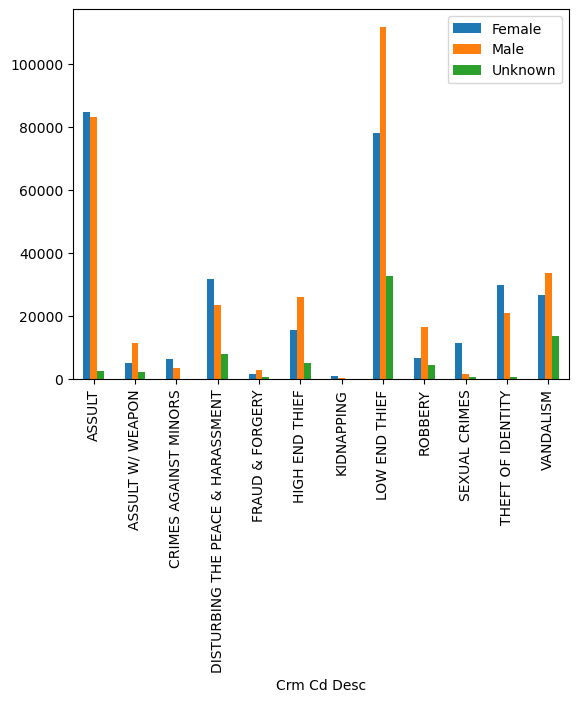

In [25]:
gc_bar = gender_crime.plot.bar()
    #stacked=True)

#creating labels in the bar graph
#for label in gc_bar.containers:
#    gc_bar.bar_label(label)


plt.legend(["Female","Male","Unknown"])
plt.savefig("../LACrime_Gender_vs_Crime.png")

In [26]:
#create bins for age ranges
age_bins = [0,18,30,40,50,60,70,80,90,100]
age_labels= ["0-18","19-25","26-30","31-40","41-50","51-60","61-70","71-80","81-100"]

#This cell continues to work, i thin my jupiter notebook needed an update to process code
LACrime_gender["Vict Age"] = pd.cut(LACrime_gender["Vict Age"], bins=age_bins, labels = age_labels, include_lowest=True)

C:\Users\ljlle\AppData\Local\Temp\ipykernel_13920\636727663.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  LACrime_gender["Vict Age"] = pd.cut(LACrime_gender["Vict Age"], bins=age_bins, labels = age_labels, include_lowest=True)


In [27]:

LACrime_gender_age = LACrime_gender.groupby(["Vict Age","Vict Sex"]).count()


del LACrime_gender_age["LAT"]
del LACrime_gender_age["LON"]
del LACrime_gender_age["DATE OCC"]
del LACrime_gender_age["TIME OCC"]
del LACrime_gender_age["Crm Cd"]
del LACrime_gender_age["AREA"]
del LACrime_gender_age["AREA NAME"]
del LACrime_gender_age["Crm Cd Desc"]
del LACrime_gender_age["Vict Descent"]
del LACrime_gender_age["Weapon Used Cd"]
del LACrime_gender_age["Weapon Desc"]

gender_age = LACrime_gender_age.pivot_table(index="Vict Age",columns="Vict Sex")

LACrime_gender_age

C:\Users\ljlle\AppData\Local\Temp\ipykernel_13920\4263393799.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  LACrime_gender_age = LACrime_gender.groupby(["Vict Age","Vict Sex"]).count()


Status
Vict Age Vict Sex        
0-18     F          18484
         M          38102
         X          63349
19-25    F          89806
         M          78989
         X           6175
26-30    F          75755
         M          79956
         X            421
31-40    F          49164
         M          56196
         X            263
41-50    F          34857
         M          44276
         X            160
51-60    F          19485
         M          26269
         X             66
61-70    F           8280
         M           8990
         X             20
71-80    F           2599
         M           2173
         X              9
81-100   F            649
         M            462
         X             26

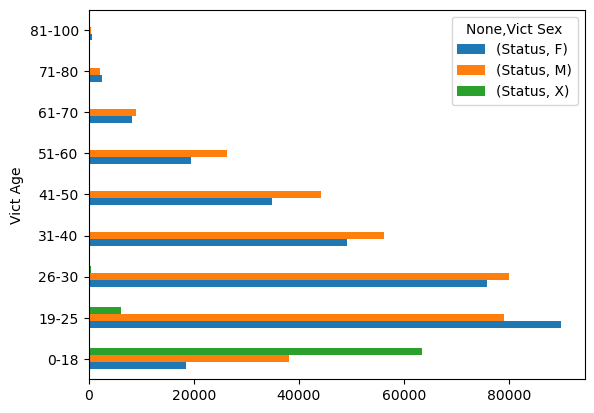

In [28]:
gender_age.plot.barh()
plt.savefig("../LACrime_Gender_vs_Age.png")

In [29]:
#Deleting the rows where LON & LAT are zero
LACrime_gender_loc = LACrime_gender.query("LON !=0")

LACrime_gender_location = LACrime_gender_loc.groupby(["LON","LAT","Vict Sex"]).count()
del LACrime_gender_location["DATE OCC"]
del LACrime_gender_location["TIME OCC"]
del LACrime_gender_location["Crm Cd"]
del LACrime_gender_location["AREA"]
del LACrime_gender_location["AREA NAME"]
del LACrime_gender_location["Vict Age"]
del LACrime_gender_location["Vict Descent"]
del LACrime_gender_location["Weapon Used Cd"]
del LACrime_gender_location["Weapon Desc"]
del LACrime_gender_location["Crm Cd Desc"]



gender_locations = LACrime_gender_location.pivot_table(index=["LON","LAT"], columns="Vict Sex")
gender_locations.fillna(0,inplace=True)
gender_locations

Status          
Vict Sex               F    M    X
LON       LAT                     
-118.6676 34.1800    0.0  5.0  0.0
-118.6673 34.1775    3.0  5.0  0.0
-118.6672 34.1824    3.0  0.0  0.0
-118.6665 34.1839    1.0  2.0  0.0
-118.6663 34.1845    0.0  1.0  0.0
...                  ...  ...  ...
-118.1580 34.0954    0.0  1.0  0.0
-118.1574 34.0955    0.0  2.0  0.0
-118.1568 34.0986    1.0  0.0  0.0
-118.1560 34.0970   14.0  4.0  2.0
-118.1554 34.0986    2.0  2.0  0.0

[71922 rows x 3 columns]

In [30]:
#Isolate the subcolumn within the pivot table
gender_locations_male = gender_locations[[col for col in gender_locations.columns if "M" in col]]
#Drop all rows with values 0
gender_loc_male = gender_locations_male[~(gender_locations_male == 0).all(axis=1)]
gender_loc_male

,,Status
,Vict Sex,M
LON,LAT,
-118.6676,34.1800,5.0
-118.6673,34.1775,5.0
-118.6665,34.1839,2.0
-118.6663,34.1845,1.0
-118.6661,34.1824,1.0
...,...,...
-118.1581,34.0955,1.0
-118.1580,34.0954,1.0


In [31]:
#Isolate the subcolumn within the pivot table
gender_locations_unknown = gender_locations[[col for col in gender_locations.columns if "X" in col]]
#Drop all rows with values 0
gender_loc_unknown = gender_locations_unknown[~(gender_locations_unknown == 0).all(axis=1)]
gender_loc_unknown

,,Status
,Vict Sex,X
LON,LAT,
-118.6462,34.1665,1.0
-118.6442,34.1886,1.0
-118.6428,34.1867,1.0
-118.6336,34.2045,1.0
-118.6333,34.1548,3.0
...,...,...
-118.1615,34.0932,1.0
-118.1610,34.0933,1.0


In [32]:
#Separate the genders to plot them in a scatter to see if there is a large hub of crimes targeted at a specific gender

#Isolate the subcolumn within the pivot table
gender_locations_female = gender_locations[[col for col in gender_locations.columns if "F" in col]]
#Drop all rows with values 0
gender_loc_female = gender_locations_female[~(gender_locations_female == 0).all(axis=1)]
gender_loc_female

,,Status
,Vict Sex,F
LON,LAT,
-118.6673,34.1775,3.0
-118.6672,34.1824,3.0
-118.6665,34.1839,1.0
-118.6661,34.1824,2.0
-118.6652,34.1774,2.0
...,...,...
-118.1584,34.0967,1.0
-118.1581,34.0955,1.0


In [33]:
#Obtaining a list of LON and LAT for gender list with no zeros
#Created a csv of the MultiIndex to make it a Dataframe
location_unknown = gender_loc_unknown["Status"].to_csv("coordinates_gender_unknown_crime.csv")
location_female = gender_loc_female["Status"].to_csv("coordinates_gender_female_crime.csv")
location_male =gender_loc_male["Status"].to_csv("coordinates_gender_male_crime.csv")

In [34]:
#Reading the csv files as Dataframe
Coordinates_unknown = pd.concat(map(pd.read_csv, ["coordinates_gender_unknown_crime.csv"]))
Coordinates_female = pd.concat(map(pd.read_csv, ["coordinates_gender_female_crime.csv"]))
Coordinates_male = pd.concat(map(pd.read_csv, ["coordinates_gender_male_crime.csv"]))


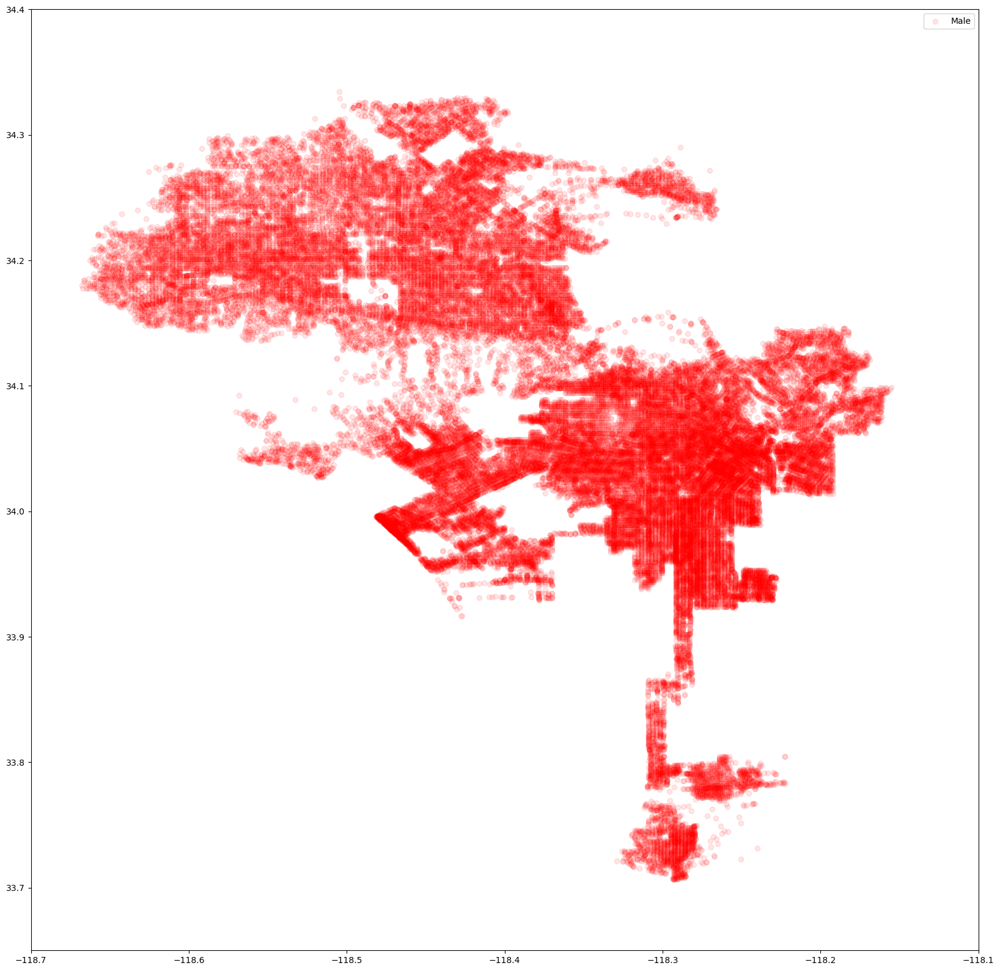

In [35]:
#Now lets plot!
plt.figure(figsize=(20,20))
x = plt.scatter(Coordinates_male["LON"],Coordinates_male["LAT"],color="r",alpha=0.1)
plt.xlim(-118.7, -118.1)
plt.ylim(33.65, 34.4)

plt.legend(["Male"])
plt.savefig("../LACrime_Gender_Male_vs_Location.png")

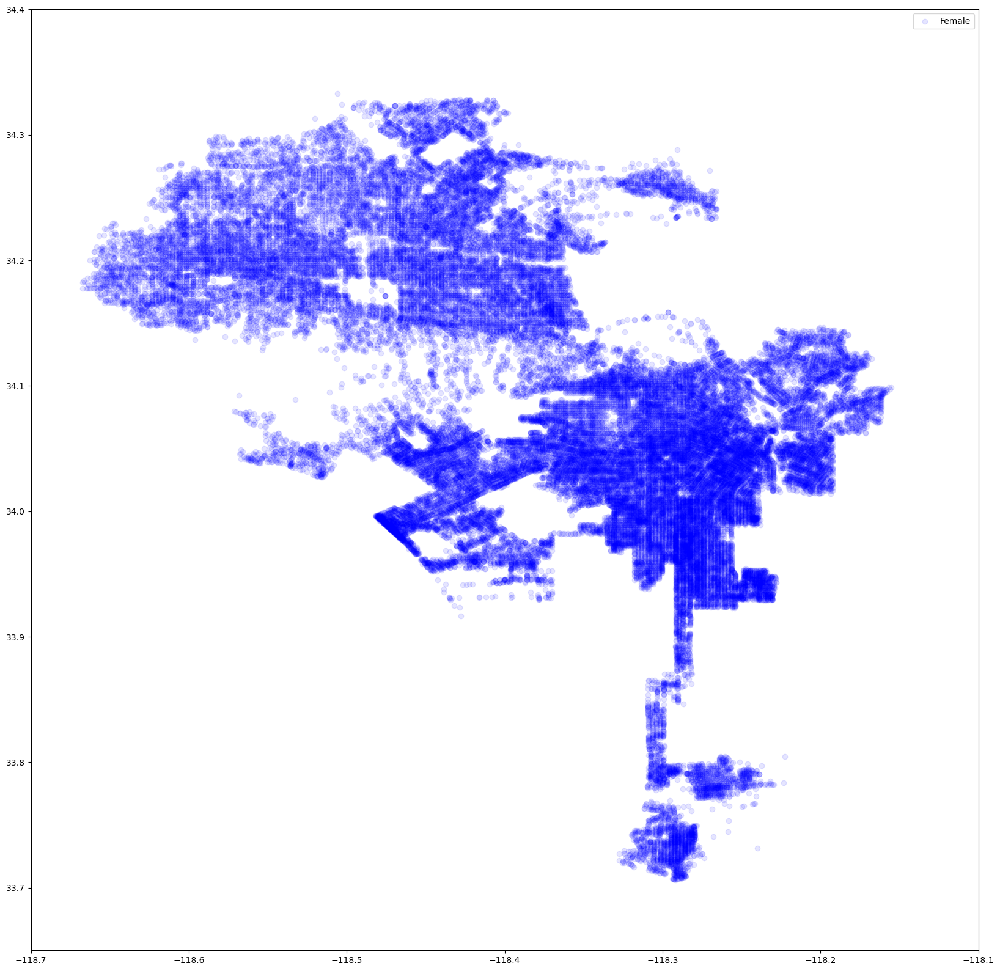

In [36]:
plt.figure(figsize=(20,20))
f = plt.scatter(Coordinates_female["LON"],Coordinates_female["LAT"],color="b",alpha=0.1)
plt.xlim(-118.7, -118.1)
plt.ylim(33.65, 34.4)

plt.legend(["Female"])
plt.savefig("../LACrime_Gender_Female_vs_Location.png")

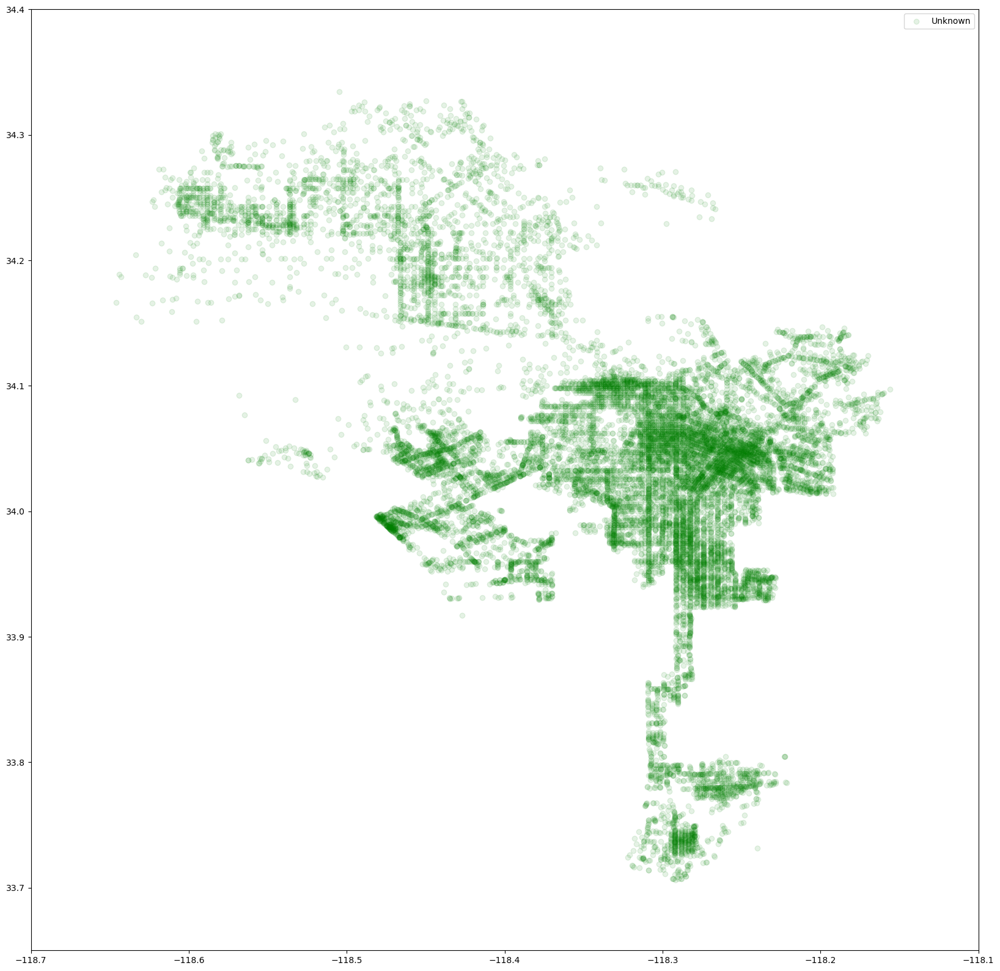

In [37]:
plt.figure(figsize=(20,20))
u = plt.scatter(Coordinates_unknown["LON"],Coordinates_unknown["LAT"],color="g",alpha=0.1)
plt.xlim(-118.7, -118.1)
plt.ylim(33.65, 34.4)

plt.legend(["Unknown"])
plt.savefig("../LACrime_Gender_Unknown_vs_Location.png")

(33.65, 34.4)

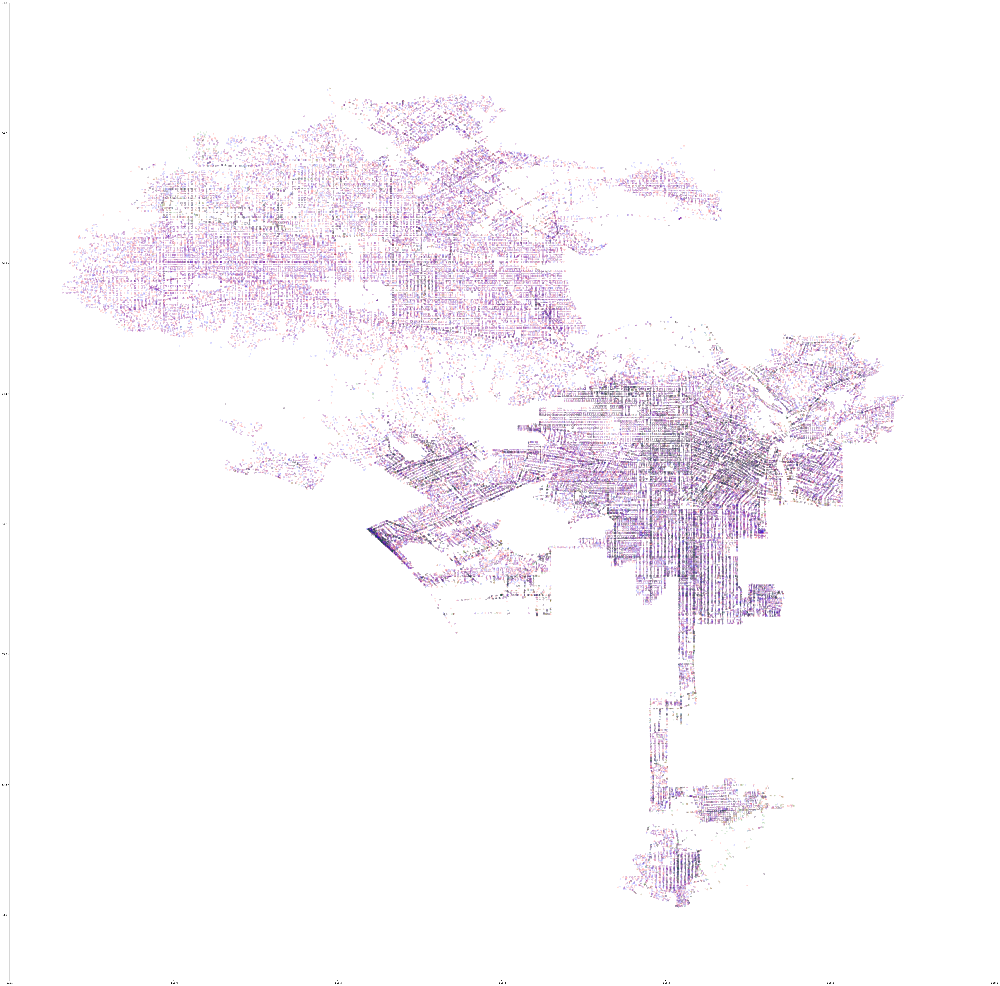

In [38]:
plt.figure(figsize=(70,70))
x = plt.scatter(Coordinates_male["LON"],Coordinates_male["LAT"],color="r",alpha=0.1)
f = plt.scatter(Coordinates_female["LON"],Coordinates_female["LAT"],color="b",alpha=0.1)
u = plt.scatter(Coordinates_unknown["LON"],Coordinates_unknown["LAT"],color="g",alpha=0.1)
plt.xlim(-118.7, -118.1)
plt.ylim(33.65, 34.4)

In [39]:
#Couldn't import Fiona module successfully which was challenging
#import geopandas as gpd

#cities = gpd.read_file(
              # gpd.datasets.get_path("naturalearth_cities"))
#cities.head()

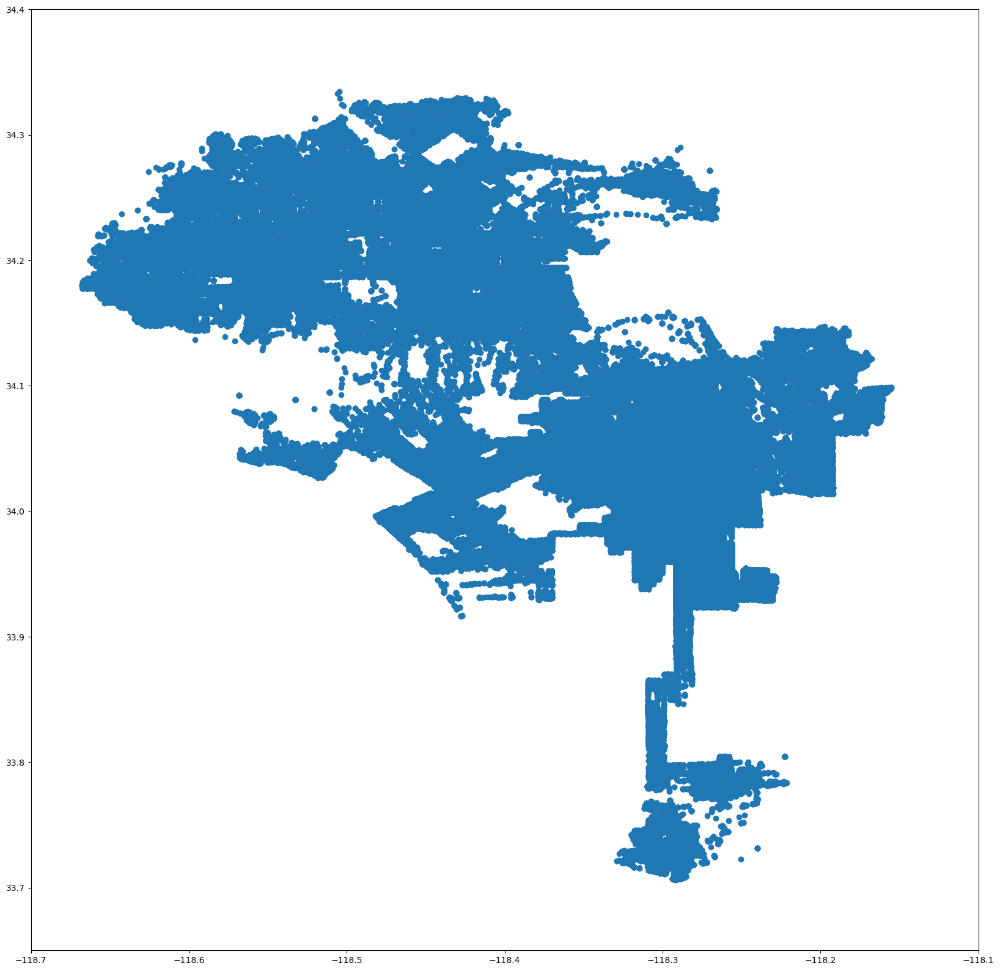

In [40]:
#Total Graph of all crime
plt.figure(figsize=(20,20))
plt.scatter(LACrime_gender_loc["LON"],LACrime_gender_loc["LAT"], marker="o")
plt.xlim(-118.7, -118.1)
plt.ylim(33.65, 34.4)
plt.show()

<Axes: xlabel='LON', ylabel='LAT'>

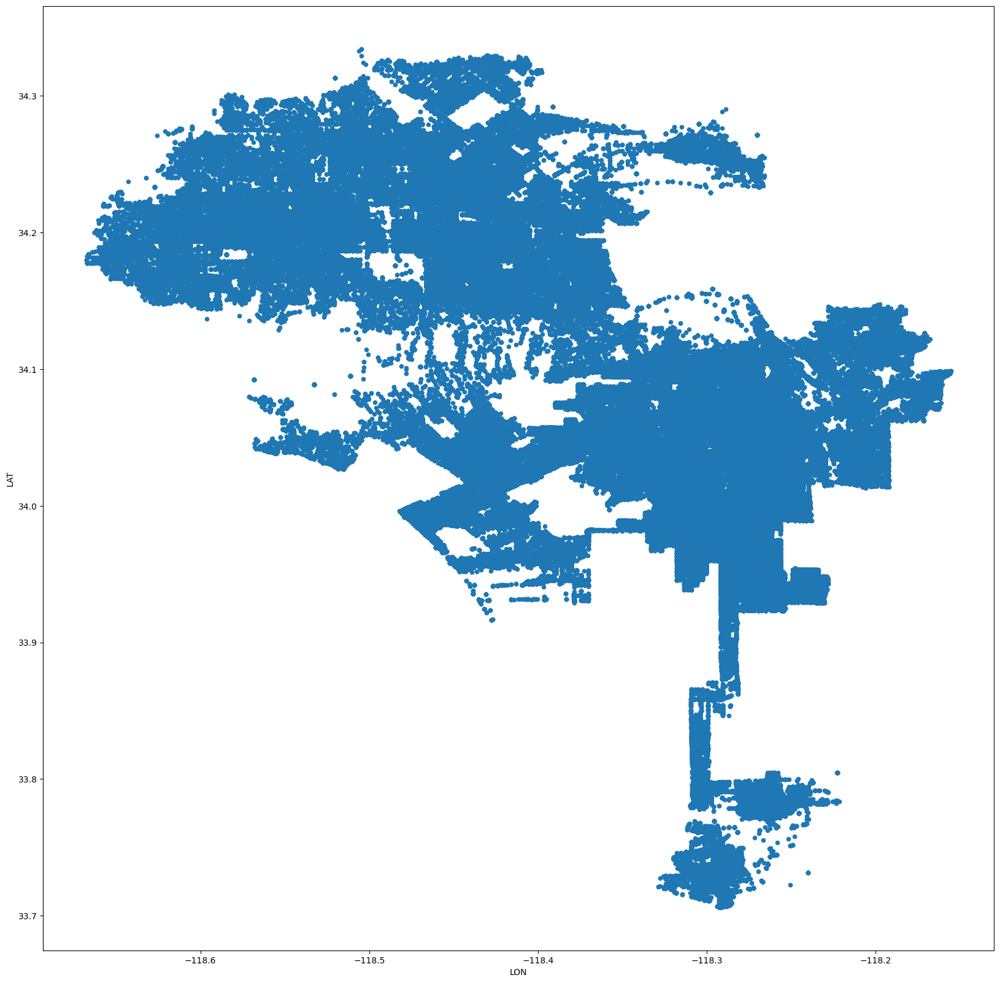

In [41]:
#Using pandas.plot to graph the same situation
fig, ax = plt.subplots(figsize=(20,20))

#cities[cities["name"]=="Los Angeles"].plot(color="light grey", ax=ax)

LACrime_gender_loc.plot(x="LON",y="LAT", kind = "scatter", ax=ax)
#ax,grid(b=True, alpha=0.5)

In [71]:
print(LACrime_path["Status"].unique())
LACrime_path["Status Desc"].unique()

['AO' 'IC' 'AA' 'JA' 'JO' 'CC']


array(['Adult Other', 'Invest Cont', 'Adult Arrest', 'Juv Arrest',
       'Juv Other', 'UNK'], dtype=object)

In [105]:
#Status is not condensed to two catregories: Closed/Arrest Made or Investigation Cont
LACrime_gender["Status"] = LACrime_gender["Status"].replace(['AO','AA','JA','JO'],"Closed/Arrest Made")
LACrime_gender["Status"] = LACrime_gender["Status"].replace(['IC'],"Investigation Cont")
LACrime_gender.head()

C:\Users\ljlle\AppData\Local\Temp\ipykernel_13920\776595604.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  LACrime_gender["Status"] = LACrime_gender["Status"].replace(['AO','AA','JA','JO'],"Closed/Arrest Made")
C:\Users\ljlle\AppData\Local\Temp\ipykernel_13920\776595604.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  LACrime_gender["Status"] = LACrime_gender["Status"].replace(['IC'],"Investigation Cont")


,LAT,LON,DATE OCC,TIME OCC,Crm Cd,AREA,AREA NAME,Status,Vict Sex,Vict Age,Vict Descent,Weapon Used Cd,Weapon Desc,Crm Cd Desc
0,34.0141,-118.2978,1/8/20 0:00,2230,624,3,Southwest,Closed/Arrest Made,F,26-30,B,400.0,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",ASSULT
1,34.0459,-118.2545,1/1/20 0:00,330,624,1,Central,Investigation Cont,M,19-25,H,500.0,UNKNOWN WEAPON/OTHER WEAPON,ASSULT
2,34.0448,-118.2474,2/13/20 0:00,1200,845,1,Central,Closed/Arrest Made,X,0-18,X,NaN,NaN,SEXUAL CRIMES
3,34.1685,-118.4019,1/1/20 0:00,1730,745,15,N Hollywood,Investigation Cont,F,61-70,W,NaN,NaN,VANDALISM
4,34.2198,-118.4468,1/1/20 0:00,415,740,19,Mission,Investigation Cont,X,26-30,X,NaN,NaN,VANDALISM


In [147]:
LACrime_gender_known=filter_rows_by_variable(LACrime_gender,"Vict Sex",["X"])
LACrime_gender_status=filter_rows_by_variable(LACrime_gender_known,"Status",["CC"])
                                                                       
LACrime_gender_status_crime = LACrime_gender_status.groupby(["Crm Cd Desc","Vict Sex","Status"]).count()
del LACrime_gender_status_crime["TIME OCC"]
del LACrime_gender_status_crime["Crm Cd"]
del LACrime_gender_status_crime["AREA"]
del LACrime_gender_status_crime["AREA NAME"]
del LACrime_gender_status_crime["Vict Age"]
del LACrime_gender_status_crime["Vict Descent"]
del LACrime_gender_status_crime["Weapon Used Cd"]
del LACrime_gender_status_crime["Weapon Desc"]
del LACrime_gender_status_crime["DATE OCC"]
del LACrime_gender_status_crime["LAT"]

print(LACrime_gender_status_crime.info())
gender_status_crime = LACrime_gender_status_crime.pivot_table(index=["Crm Cd Desc"],columns=["Status","Vict Sex"])

#gender_status_crime.fillna(0,inplace=True)
gender_status_crime

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 48 entries, ('ASSULT', 'F', 'Closed/Arrest Made') to ('VANDALISM', 'M', 'Investigation Cont')
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   LON     48 non-null     int64
dtypes: int64(1)
memory usage: 828.0+ bytes
None


LON           \
Status                            Closed/Arrest Made            
Vict Sex                                           F        M   
Crm Cd Desc                                                     
ASSULT                                       41406.0  31928.0   
ASSULT W/ WEAPON                              2186.0   4267.0   
CRIMES AGAINST MINORS                         3665.0   2171.0   
DISTURBING THE PEACE & HARASSMENT            14363.0   8470.0   
FRAUD & FORGERY                                127.0    197.0   
HIGH END THIEF                                 685.0   1657.0   
KIDNAPPING                                     444.0    124.0   
LOW END THIEF                                 4687.0   7098.0   
ROBBERY                                       2099.0   3968.0   
SEXUAL CRIMES                                 3751.0    522.0   
THEFT OF IDENTITY                              326.0    433.0   
VANDALISM                                     4370.0   5205.0   

                                                                
Status                            Investigation Cont            
Vict Sex                                           F         M  
Crm Cd Desc                                                     
ASSULT                                       43269.0   51210.0  
ASSULT W/ WEAPON                              3024.0    7245.0  
CRIMES AGAINST MINORS                         2650.0    1307.0  
DISTURBING THE PEACE & HARASSMENT            17484.0   15104.0  
FRAUD & FORGERY                               1540.0    2706.0  
HIGH END THIEF                               14877.0   24242.0  
KIDNAPPING                                     469.0     154.0  
LOW END THIEF                                73535.0  104675.0  
ROBBERY                                       4595.0   12576.0  
SEXUAL CRIMES                                 7695.0    1181.0  
THEFT OF IDENTITY                            29659.0   20437.0  
VANDALISM                                    22179.0   28549.0

[Text(1, 0, 'Closed [F]'),
 Text(2, 0, 'Closed [M]'),
 Text(3, 0, 'Open [F]'),
 Text(4, 0, 'Open [M]')]

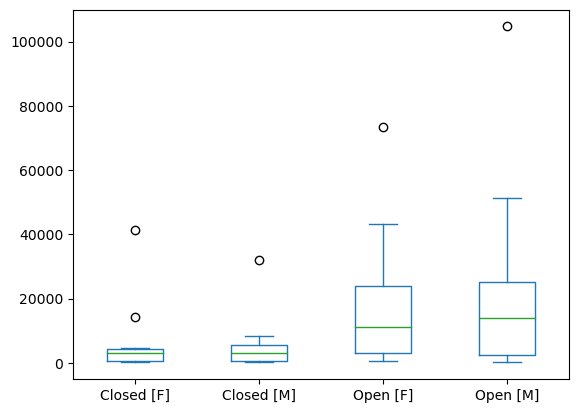

In [142]:
status_gender=gender_status_crime.plot.box()
status_gender.set_xticklabels(('Closed [F]','Closed [M]','Open [F]', 'Open [M]'))

<Axes: xlabel='Crm Cd Desc'>

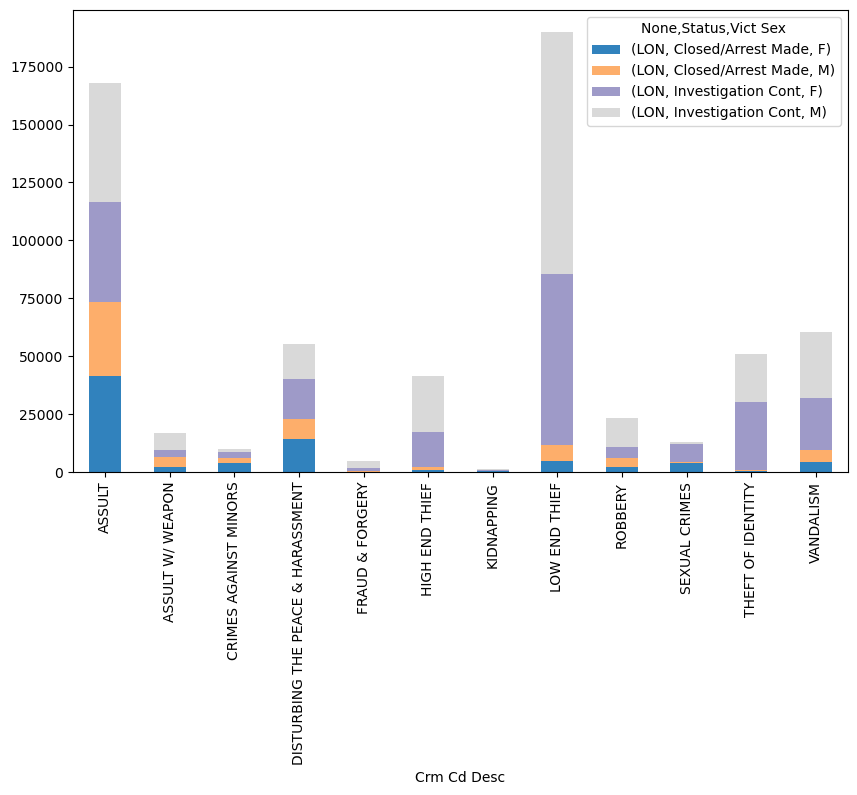

In [135]:
#plt.figure(figsize=(40,40))
gender_status_crime.plot(kind='bar', 
                    stacked=True, 
                    colormap='tab20c', 
                    figsize=(10, 6))


<Axes: ylabel='Crm Cd Desc'>

<Figure size 7000x10000 with 0 Axes>

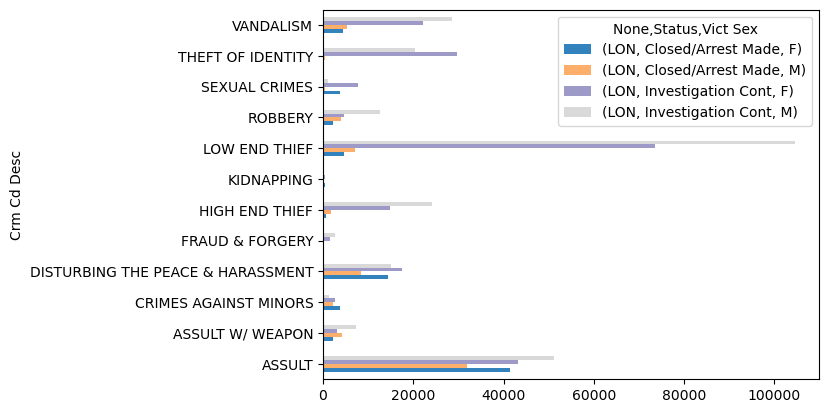

In [148]:
plt.figure(figsize=(70,100))
gender_status_crime.plot.barh(colormap="tab20c")
#plt.legend(["Female: Case Closed","Male: Case Closed","Female: Invt Cont","Male: Invt Cont"])